In [76]:
### Imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import umap
import optuna
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import TimeSeriesSplit
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier

from setup_utils import setup_db_connection
engine = setup_db_connection()

In [5]:
# Define VITAL_COLS, VITAL_QUERY. Load data into vitals_df
VITAL_COLS = ['heart_rate', 'sbp', 'dbp', 'mbp', 'resp_rate', 'temperature', 'spo2']
VITAL_QUERY = f"""
SELECT v.*
FROM mimiciv_derived.vitalsign v
WHERE v.subject_id IN (
    SELECT DISTINCT subject_id
    FROM mimiciv_derived.vitalsign
    LIMIT 100
);"""
vitals_df = pd.read_sql_query(VITAL_QUERY, engine)
# vitals_df: convert charttime to datetime, set index
vitals_df['charttime'] = pd.to_datetime(vitals_df['charttime'])
vitals_df.set_index('charttime', inplace=True)

In [3]:
# Data quality; IQR, conversions etc...

def inspect_dataframe(df, cols_to_check=None):
    """
    Inspect key information and data quality metrics of a dataframe.
    
    Args:
        df: DataFrame to inspect
        cols_to_check: Optional list of columns to analyze for data quality metrics
    """
    print("\n=== ===")
    print("Shape:", df.shape)
    print("\nColumns:", df.columns.tolist())
    print("\nSample of first few rows:")
    print(df.head(2))
    
    if cols_to_check:
        stats = {
            'missing_pct': df[cols_to_check].isnull().mean() * 100,
            'unique_values': df[cols_to_check].nunique(),
            'min_values': df[cols_to_check].min(),
            'max_values': df[cols_to_check].max()
        }
        
        print("\n=== Data Quality Report ===")
        for metric, values in stats.items():
            print(f"\n{metric}:")
            print(values)


def remove_outliers_iqr(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df


class PlotData:
    """
    Container for embedding data and associated cluster labels.
    
    Attributes:
        method (str): Name of the dimensionality reduction method (e.g., 'PCA', 'UMAP').
        embedding (np.ndarray or pd.DataFrame): 2D embedding coordinates.
        clusters (np.ndarray or list): Cluster labels corresponding to each point.
    """
    def __init__(self, method, embedding, clusters):
        self.method = method
        # Ensure embedding is a NumPy array for consistency.
        if isinstance(embedding, pd.DataFrame):
            self.embedding = embedding.values
        else:
            self.embedding = np.array(embedding)
        self.clusters = np.array(clusters)



In [71]:
# Plotting functions

def plot_vital_trends(daily, weekly, monthly, vital_cols):
    """
    Plots Daily, Weekly, and Monthly vitals for all columns in vital_cols.
    """
    plt.figure(figsize=(15, 25))  # Adjust figure size
    plt.suptitle('Vitals Over Time (Combined Plots)', fontsize=16, y=0.98) 

    # Colors and styles for readability
    styles = {
        'daily': {'color': 'blue', 'label_suffix': 'Daily', 'linestyle': '-'},
        'weekly': {'color': 'orange', 'label_suffix': 'Weekly', 'linestyle': '--'},
        'monthly': {'color': 'green', 'label_suffix': 'Monthly', 'linestyle': ':'},
    }

    # Loop through each vital column
    for i, col in enumerate(vital_cols):
        # Create a subplot
        ax = plt.subplot(len(vital_cols), 1, i + 1)

        # Define common plot lines to avoid repetition
        for key, data in zip(['daily', 'weekly', 'monthly'], [daily, weekly, monthly]):
            plt.plot(
                data['charttime'],
                data[col],
                label=f"{styles[key]['label_suffix']} {col}",
                color=styles[key]['color'],
                linestyle=styles[key]['linestyle']
            )

        # Titles and labels for each subplot
        ax.set_title(f'{col} Over Time', fontsize=12)  # Define font size explicitly
        ax.set_xlabel('Date')
        ax.set_ylabel(col)
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])  # Define a padding area for title
    plt.show()


def plot_vital_distributions(daily, weekly, monthly, vital_cols):
    """
    Shows distributions of vitals over different resampling periods (daily, weekly, monthly).
    """
    data_frames = {'Daily': daily, 'Weekly': weekly, 'Monthly': monthly}
    plt.figure(figsize=(15, 20))

    for i, col in enumerate(vital_cols):
        for j, (period, df) in enumerate(data_frames.items()):
            ax = plt.subplot(len(vital_cols), len(data_frames), i * len(data_frames) + j + 1)
            sns.histplot(df[col], kde=True, ax=ax, bins=30, color='skyblue')
            ax.set_title(f'Distribution of {col} ({period})', fontsize=10)
            ax.set_xlabel(col)
            ax.set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


def plot_distribution_comparison(original_df, cleaned_df, vital_cols, title_prefix="Monthly", figsize=(15, 20)):
    """
    Compares the distributions of vital columns before and after cleaning for outliers.
    Args:
        original_df (DataFrame): The original dataframe before cleaning.
        cleaned_df (DataFrame): The cleaned dataframe after outlier removal.
        vital_cols (list): List of vital column names to compare.
        title_prefix (str): Prefix for the title (e.g., "Daily", "Weekly", "Monthly").
        figsize (tuple): Size of the plot figure.

    Returns:
        None: Displays a comparison plot of distributions with text output and difference visualizations.
    """
    # Compute and display summary statistics
    for col in vital_cols:
        print(f"\n=== {col} Statistics ({title_prefix}) ===")
        print(f"Original {title_prefix} Mean: {original_df[col].mean():.2f}, Std Dev: {original_df[col].std():.2f}")
        print(f"Cleaned {title_prefix} Mean: {cleaned_df[col].mean():.2f}, Std Dev: {cleaned_df[col].std():.2f}")
        print(f"Reduction in Rows for {col}: {len(original_df) - len(cleaned_df)}")

    # Create a difference DataFrame between original and cleaned data for visualization
    diff_df = original_df[vital_cols].describe() - cleaned_df[vital_cols].describe()

    # Plot distributions before and after cleaning
    data_frames = {f'Original {title_prefix}': original_df, f'Cleaned {title_prefix}': cleaned_df}
    plt.figure(figsize=figsize)

    for i, col in enumerate(vital_cols):
        for j, (period, df) in enumerate(data_frames.items()):
            ax = plt.subplot(len(vital_cols), len(data_frames), i * len(data_frames) + j + 1)
            sns.histplot(df[col], kde=True, ax=ax, bins=30, color='skyblue' if "Original" in period else 'green')
            ax.set_title(f'Distribution of {col} ({period})', fontsize=10)
            ax.set_xlabel(col)
            ax.set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    # Visualize differences in summary metrics
    diff_df.loc[['mean', 'std', '25%', '50%', '75%']].plot(kind='bar', figsize=(10, 6), title="Difference in Metrics After Cleaning")
    plt.ylabel("Difference")
    plt.xlabel("Statistic")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


def plot_trend_with_deviation(df_cleaned, vital_cols, title, downsample_factor=1):
    """
    Creates separate plots for each vital in vital_cols, showing its median 
    with ±1 standard deviation as a gradient. Downsampling is applied to reduce
    the number of points plotted.

    Args:
    df_cleaned (DataFrame): Cleaned DataFrame (daily, weekly, or monthly)
    vital_cols (list): List of vital column names
    title (str): Title prefix for the plots (e.g., "Daily", "Weekly", "Monthly")
    downsample_factor (int): Factor by which to downsample the data (default: 1 = no downsampling)
    """
    # Downsample the dataframe if needed
    if downsample_factor > 1:
        df_downsampled = df_cleaned.iloc[::downsample_factor].copy()
    else:
        df_downsampled = df_cleaned

    time_series = df_downsampled['charttime'] 

    for vital in vital_cols:
        medians = df_downsampled[vital].rolling(window=5, min_periods=1).median()
        std_devs = df_downsampled[vital].rolling(window=5, min_periods=1).std()

        plt.figure(figsize=(12, 6))

        # Plot the gradient (±1 standard deviation)
        plt.fill_between(
            time_series,
            medians - std_devs,
            medians + std_devs,
            alpha=0.3,
            label=f'±1 Std Dev: {vital}'
        )

        # Plot the median line
        plt.plot(time_series, medians, label=f'Median: {vital}', color='blue')

        # Add title and labels
        plt.title(f'{title} - {vital.capitalize()} Trends Over Time', fontsize=14)
        plt.xlabel('Time', fontsize=12)
        plt.ylabel(f'{vital.capitalize()} Value', fontsize=12)

        # Add grid and legend
        plt.grid(visible=True, linestyle='--', alpha=0.6)
        plt.legend(fontsize=10)
        plt.tight_layout()

        # Display the plot
        plt.show()


def plot_feature_distributions(df, feature_types, max_features=None, figsize=(15, 5)):
    """
    Plot distribution of features by type with an optional feature limit.
    
    Args:
        df: DataFrame with features
        feature_types: Dictionary mapping feature types to feature lists
        max_features: Optional cap on number of features per type (None for all)
        figsize: Figure size tuple
    """
    plot_df = df.reset_index(drop=True)
    
    for ftype, features in feature_types.items():
        plot_features = features if max_features is None else features[:max_features]
        n_features = len(plot_features)
        
        if n_features == 0:
            continue
            
        n_cols = 1  # Keep images 1 per row
        n_rows = n_features  # Direct mapping to avoid squeezed plots
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize[0], 5 * n_rows))
        fig.suptitle(f'{ftype} Feature Distributions', fontsize=16)
        
        if n_features == 1:
            axes = [axes]
        
        for idx, feature in enumerate(plot_features):
            if feature not in plot_df.columns:
                continue
                
            ax = axes[idx]
            valid_data = plot_df[feature].dropna()
            
            try:
                sns.histplot(data=valid_data, kde=True, ax=ax)
                ax.set_title(f'{feature} Distribution')
                ax.set_xlim(valid_data.min(), valid_data.max())
                
                mean_val = valid_data.mean()
                std_val = valid_data.std()
                ax.axvline(mean_val, color='r', linestyle='--', alpha=0.5)
                ax.text(0.02, 0.95, f'Mean: {mean_val:.2f}\nStd: {std_val:.2f}', 
                        transform=ax.transAxes)
            except Exception as e:
                print(f"Error plotting {feature}: {str(e)}")
        
        plt.tight_layout()
        plt.show()


def plot_temporal_patterns(df, feature_types, time_unit='hour', figsize=(15, 5)):
    """
    Plot features against temporal dimensions with improved spacing.
    
    Args:
        df: DataFrame with features
        feature_types: Dictionary mapping feature types to feature lists
        time_unit: Temporal unit to plot against ('hour', 'day_of_week')
        figsize: Figure size tuple
    """
    plot_df = df.reset_index(drop=True)
    
    for ftype, features in feature_types.items():
        if ftype in ['Temporal']:  # Skip temporal features themselves
            continue
            
        plot_features = features
        n_features = len(plot_features)
        
        if n_features == 0:
            continue
            
        n_cols = 1  # Keep images 1 per row
        n_rows = n_features  # Direct mapping to avoid squeezed plots
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize[0], 5 * n_rows))
        fig.suptitle(f'{ftype} Features by {time_unit}', fontsize=16, y=1.02)
        
        if n_features == 1:
            axes = [axes]
        
        for idx, feature in enumerate(plot_features):
            if feature not in plot_df.columns:
                continue
                
            ax = axes[idx]
            try:
                sns.boxplot(data=plot_df, x=time_unit, y=feature, ax=ax)
                ax.set_title(f'{feature} by {time_unit}')
                
                # Rotate x-axis labels if needed
                ax.tick_params(axis='x', rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
            except Exception as e:
                print(f"Error plotting {feature}: {str(e)}")
        
        plt.tight_layout()
        plt.show()


def plot_feature_correlations_r2(df, feature_types, threshold=0.4, figsize=(22, 18)):
    """
    Plot correlation heatmap with improved readability
    """
    # Ensure we have a clean index
    plot_df = df.reset_index(drop=True)
    
    # Get features and organize by type
    feature_map = {}
    for ftype, features in feature_types.items():
        for f in features:
            if f in plot_df.columns:
                # Simplify feature names for readability
                simple_name = f.replace('_rate', '').replace('_change', '_chg')
                feature_map[f] = {'type': ftype, 'simple_name': simple_name}
    
    # Calculate correlation matrix
    corr_matrix = plot_df[list(feature_map.keys())].corr()
    
    # Create figure with larger size
    plt.figure(figsize=figsize)
    
    # Mask setup
    mask = np.zeros_like(corr_matrix, dtype=bool)
    mask[np.triu_indices_from(mask)] = True  # Mask upper triangle
    mask |= np.abs(corr_matrix) < threshold  # Mask low correlations
    
    # Custom annotation function to improve readability
    def annotation_formatter(val):
        if np.abs(val) >= threshold:
            return f'{val:.2f}'
        return ''
    
    # Create heatmap with improved styling
    sns.heatmap(corr_matrix, 
                mask=mask,
                cmap='RdBu_r',
                center=0,
                annot=True,
                fmt='.2f',
                annot_kws={'size': 8},
                square=True,
                linewidths=0.5,
                cbar_kws={'label': 'Correlation Coefficient',
                         'shrink': 0.8})
    
    # Improve labels
    ax = plt.gca()
    
    # Simplify and rotate labels
    labels = [feature_map[f]['simple_name'] for f in corr_matrix.columns]
    ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
    ax.set_yticklabels(labels, rotation=0, fontsize=8)
    
    # Add feature type grouping
    type_boundaries = {}
    current_pos = 0
    for ftype in feature_types.keys():
        type_features = [f for f, info in feature_map.items() if info['type'] == ftype]
        if type_features:
            type_boundaries[ftype] = (current_pos, current_pos + len(type_features))
            current_pos += len(type_features)
    
    # Add group separators and labels
    for ftype, (start, end) in type_boundaries.items():
        # Add separating lines
        ax.axvline(x=start, color='black', linewidth=1.5, alpha=0.3)
        ax.axhline(y=start, color='black', linewidth=1.5, alpha=0.3)
        
        # Add group labels
        plt.text(start + (end-start)/2, -1.5, ftype, 
                ha='center', va='top', rotation=45,
                fontsize=10, fontweight='bold')
    
    # Add title with information
    plt.title(f'Feature Correlations\n(|correlation| > {threshold})\n', 
              pad=20, fontsize=14, fontweight='bold')
    
    # Create a summary of strongest correlations
    strong_correlations = []
    for i in range(len(corr_matrix)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) >= 0.7:  # Threshold for "strong" correlations
                strong_correlations.append({
                    'feature1': labels[i],
                    'feature2': labels[j],
                    'correlation': corr_matrix.iloc[i, j]
                })
    
    # Sort by absolute correlation value
    strong_correlations.sort(key=lambda x: abs(x['correlation']), reverse=True)
    
    # Print summary of strongest correlations
    print("\nStrongest Feature Correlations (|correlation| >= 0.7):")
    for corr in strong_correlations[:10]:  # Show top 10
        print(f"{corr['feature1']} ~ {corr['feature2']}: {corr['correlation']:.3f}")
    
    plt.tight_layout()
    plt.show()


def plot_embedding(plot_data_obj, title=None, ax=None, point_size=50, cmap="viridis"):
    """
    Plots the 2D embedding along with clustering results.
    
    Args:
        plot_data_obj (PlotData or dict): Object containing `embedding` and `clusters`.
        title (str, optional): Plot title. If not provided, uses the method name.
        ax (matplotlib.axes.Axes, optional): Axis to plot on. Creates a new figure if None.
        point_size (int): Size of the scatter points.
        cmap (str): Colormap for clusters.
    
    Returns:
        matplotlib.axes.Axes: The axis with the plotted data.
    """
    # Allow passing a dict with 'embedding' and 'clusters'
    if isinstance(plot_data_obj, dict):
        embedding = np.array(plot_data_obj.get('embedding'))
        clusters = np.array(plot_data_obj.get('clusters'))
        method = plot_data_obj.get('method', 'Embedding')
    elif hasattr(plot_data_obj, "embedding") and hasattr(plot_data_obj, "clusters"):
        embedding = plot_data_obj.embedding
        clusters = plot_data_obj.clusters
        method = getattr(plot_data_obj, "method", "Embedding")
    else:
        raise ValueError("Input object must have 'embedding' and 'clusters' attributes or keys.")
    
    # Use first two dimensions for plotting
    if embedding.shape[1] < 2:
        raise ValueError("Embedding must have at least 2 dimensions for plotting.")
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))
    
    scatter = ax.scatter(embedding[:, 0], embedding[:, 1], c=clusters, s=point_size, cmap=cmap, alpha=0.8)
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")
    ax.set_title(title if title else f"{method} Embedding")
    
    # Optionally, add a colorbar
    plt.colorbar(scatter, ax=ax, label="Cluster Label")
    
    return ax




In [46]:
# Feature Engineering functions; Temporal, common interactions, derived statistics, variability

def add_temporal_features(df, from_col=None):
    """
    Add temporal features to a DataFrame based on a timestamp column or index.
    
    This function detects a timestamp source either from a specified column/index
    or by searching for names containing 'time'. It then creates temporal features:
      - hour: Hour of the day from the timestamp.
      - day_of_week: Day of the week from the timestamp.
      - is_night: Binary indicator if the time is considered nighttime (22:00-05:00).
      - hours_since_first: Hours elapsed since the first measurement per subject, if 'subject_id' exists.
    
    Args:
        df (pd.DataFrame): DataFrame containing at least one timestamp column or index.
        from_col (str, optional): Name of the column or index to use as the timestamp. 
            If not specified, the function will search for columns containing 'time' 
            and then check the index name if necessary.
    
    Returns:
        pd.DataFrame: DataFrame with additional temporal feature columns.
    """
    result_df = df.copy()

    # Determine the timestamp source
    if from_col:
        if from_col in result_df.columns:
            timestamp_series = pd.to_datetime(result_df[from_col], errors='coerce')
            used_source = f"column '{from_col}'"
        elif result_df.index.name == from_col:
            timestamp_series = pd.to_datetime(result_df.index.to_series(), errors='coerce')
            used_source = f"index '{from_col}'"
        else:
            raise ValueError(f"Specified timestamp source '{from_col}' not found as a column or index name.")
        print(f"\nUsing specified {used_source} as timestamp source")
    else:
        # Search for columns with 'time' in their name
        time_columns = [col for col in result_df.columns if 'time' in col.lower()]
        print("\nPotential timestamp columns found:", time_columns)
        if time_columns:
            timestamp_series = pd.to_datetime(result_df[time_columns[0]], errors='coerce')
            used_source = f"column '{time_columns[0]}'"
            # print(f"\nUsing {used_source} as timestamp source")
        # Fallback: check if index name contains 'time'
        elif result_df.index.name and 'time' in result_df.index.name.lower():
            timestamp_series = pd.to_datetime(result_df.index.to_series(), errors='coerce')
            used_source = f"index '{result_df.index.name}'"
            print(f"\nUsing {used_source} as timestamp source")
        else:
            print("No timestamp column or index found in the data")
            return result_df

    # Add basic temporal features
    result_df['hour'] = timestamp_series.dt.hour
    result_df['day_of_week'] = timestamp_series.dt.dayofweek

    # Additional feature: is_night (1 if hour between 22 and 5, else 0)
    result_df['is_night'] = ((timestamp_series.dt.hour >= 22) | (timestamp_series.dt.hour <= 5)).astype(int)

    # Additional feature: hours_since_first per subject (if subject_id exists)
    if 'subject_id' in result_df.columns:
        for subject in result_df['subject_id'].unique():
            mask = result_df['subject_id'] == subject
            first_time = timestamp_series[mask].min()
            result_df.loc[mask, 'hours_since_first'] = (
                (timestamp_series[mask] - first_time).dt.total_seconds() / 3600
            )
    else:
        print("Column 'subject_id' not found; skipping 'hours_since_first' feature.")
    
    # Print the names of new features added
    new_features = ['hour', 'day_of_week', 'is_night']
    if 'subject_id' in result_df.columns:
        new_features.append('hours_since_first')
    print("\nNew temporal features added:", new_features)
    
    return result_df, new_features


def add_vital_ratio_and_interaction_features(df):
    """
    Create vital ratio and interaction features from vital sign measurements.
    
    This function computes several features based on vital sign data:
      - shock_index: heart_rate / sbp.
      - map_calculated: (sbp + 2 * dbp) / 3.
      - rox_index: spo2 / resp_rate.
      - pressure_rate_product: sbp * heart_rate.
      - temp_hr_ratio: heart_rate / temperature.
      - o2_efficiency: spo2 / resp_rate.
      
    Args:
        df (pd.DataFrame): Input DataFrame with vital measurements.
    
    Returns:
        pd.DataFrame: DataFrame with the new ratio and interaction features.
    """
    result_df = df.copy()
    
    # -------------------------------
    # Add common ratio features
    # -------------------------------
    # Shock index (heart_rate / sbp)
    result_df['shock_index'] = df['heart_rate'] / df['sbp']
    
    # Mean Arterial Pressure (MAP): (sbp + 2 * dbp) / 3
    result_df['map_calculated'] = (df['sbp'] + 2 * df['dbp']) / 3
    
    # ROX index (spo2 / resp_rate) - simplified version
    result_df['rox_index'] = df['spo2'] / df['resp_rate']
    
    # -------------------------------
    # Add interaction features
    # -------------------------------
    # Pressure-Rate Product (sbp * heart_rate)
    result_df['pressure_rate_product'] = df['sbp'] * df['heart_rate']
    
    # Temperature-HR ratio (heart_rate / temperature)
    result_df['temp_hr_ratio'] = df['heart_rate'] / df['temperature']
    
    # SpO2/RR efficiency (spo2 / resp_rate)
    result_df['o2_efficiency'] = df['spo2'] / df['resp_rate']
    
    # Consolidate list of new features added
    new_features = [
        'shock_index', 'map_calculated', 'rox_index',
        'pressure_rate_product', 'temp_hr_ratio', 'o2_efficiency'
    ]
    print("\nNew columns added:", new_features)
    
    return result_df, new_features


def add_statistical_features(df, vital_cols=VITAL_COLS):
    """
    Create statistical features for each vital sign.
    
    Args:
        df (pd.DataFrame): Input DataFrame with vital measurements.
        vital_cols (list): List of vital sign column names. Defaults to VITAL_COLS.
    
    Returns:
        pd.DataFrame: DataFrame with new statistical features.
    """
    result_df = df.copy()
    
    # Group by subject_id to calculate per-patient stats for each vital sign in vital_cols
    for col in vital_cols:
        # Skip if the vital column doesn't exist
        if col not in df.columns:
            print(f"Column '{col}' not found in DataFrame, skipping...")
            continue
        
        group = df.groupby('subject_id')[col]
        
        # Calculate basic statistics for the column
        result_df[f'{col}_mean'] = group.transform('mean')
        result_df[f'{col}_std']  = group.transform('std')
        result_df[f'{col}_min']  = group.transform('min')
        result_df[f'{col}_max']  = group.transform('max')
    
    # Identify new statistical feature columns
    new_features = [col for col in result_df.columns if any(suffix in col for suffix in ['_mean', '_std', '_min', '_max'])]
    print("\nNew statistical columns added:", new_features)
    
    
    return result_df, new_features


def add_variability_features(df, vital_cols=VITAL_COLS):
    """
    Create features capturing vital sign variability.
    
    Args:
        df (pd.DataFrame): Input DataFrame with vital measurements.
        vital_cols (list): List of vital sign column names to process. Defaults to VITAL_COLS.
    
    Returns:
        pd.DataFrame: DataFrame with new variability features.
    """
    result_df = df.copy()
    
    for col in vital_cols:
        if col not in df.columns:
            print(f"Column '{col}' not found in DataFrame, skipping...")
            continue
        
        # Calculate changes between consecutive measurements for each subject
        result_df[f'{col}_diff'] = df.groupby('subject_id')[col].diff()
        
        # Calculate absolute changes
        result_df[f'{col}_abs_diff'] = result_df[f'{col}_diff'].abs()
        
        # Calculate percent changes
        result_df[f'{col}_pct_change'] = df.groupby('subject_id')[col].pct_change(fill_method=None)
    
    # Identify new variability feature columns
    new_features = [col for col in result_df.columns if any(suffix in col for suffix in ['_diff', '_pct_change'])]
    print("\nNew variability features added:", new_features)
    
    return result_df, new_features




In [ ]:
# Clustering functions; PCA, UMAP, KMeans, RandomForest model wrappers

def prepare_features(df, feature_types, n_components=0.95, transformers=None):
    """
    Prepare features for clustering and analysis by handling missing values, 
    applying standardization, and performing PCA.
    
    Args:
        df (pd.DataFrame): Input dataframe with engineered features
        feature_types (dict): Dictionary mapping feature types to column names
        n_components (float): Variance ratio to preserve in PCA
        transformers (dict, optional): Pre-fitted transformers (scaler, PCA, imputer)
    
    Returns:
        tuple: (transformed_features, transformers_dict)
            - transformed_features: PCA-transformed feature matrix
            - transformers_dict: Dictionary containing fitted scaler, PCA, and imputer objects
    """
    # Get numerical features
    numeric_features = [col for ftype in feature_types.values() for col in ftype 
                        if col in df.columns and df[col].dtype in ['float64', 'int64']]
    
    if transformers is None:
        print("Fitting new transformers...")
        
        # Handle missing values (Impute with mean)
        imputer = SimpleImputer(strategy='mean')
        X_imputed = imputer.fit_transform(df[numeric_features])
        
        # Standardize features
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_imputed)
        
        # Apply PCA
        pca = PCA(n_components=n_components)
        X_pca = pca.fit_transform(X_scaled)
        
        transformers = {'scaler': scaler, 'pca': pca, 'imputer': imputer}
    else:
        print("Using existing transformers...")
        X_imputed = transformers['imputer'].transform(df[numeric_features])
        X_scaled = transformers['scaler'].transform(X_imputed)
        X_pca = transformers['pca'].transform(X_scaled)
    
    # Create DataFrame with transformed features
    pca_cols = [f'PC_{i+1}' for i in range(X_pca.shape[1])]
    X_transformed = pd.DataFrame(X_pca, columns=pca_cols, index=df.index)
    
    return X_transformed, transformers


def optimize_umap(X_transformed, n_trials=20):
    """
    Optimize UMAP parameters using Optuna.
    
    Args:
        X_transformed (pd.DataFrame): PCA-transformed feature matrix
        n_trials (int): Number of optimization trials
    
    Returns:
        dict: Best UMAP parameters and best score
    """
    def objective(trial):
        n_neighbors = trial.suggest_int("n_neighbors", 2, 100)
        min_dist = trial.suggest_float("min_dist", 0.0, 0.99)
        n_components = trial.suggest_int("n_components", 2, 10)
        metric = trial.suggest_categorical("metric", ["euclidean", "manhattan", "cosine", "correlation"])
        
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components, metric=metric, random_state=42, n_jobs=1)
        embedding = reducer.fit_transform(X_transformed)
        
        # Evaluate using variance explained (proxy for structure retention)
        score = -embedding.var(axis=0).sum()
        return score
    
    study = optuna.create_study(direction="minimize")
    study.optimize(objective, n_trials=n_trials)
    
    return {"best_params": study.best_params, "best_score": study.best_value}


# todo Reduce, or not to reduce? That is the question. Need a reducer fn.
# We add quite a few features, but take both approaches (PCA, UMAP/reduced) into account @ time of writing.


def optimize_clusters(X_transformed, max_k=15):
    """
    Find the optimal number of clusters using the Elbow Method and Silhouette Score.
    
    Args:
        X_transformed (pd.DataFrame): PCA-transformed feature matrix
        max_k (int): Maximum number of clusters to evaluate
    
    Returns:
        dict: Optimal number of clusters and associated metrics
    """    
    scores = {}
    distortions = []
    silhouette_scores = []
    
    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, n_init=10)
        cluster_labels = kmeans.fit_predict(X_transformed)
        distortions.append(kmeans.inertia_)
        silhouette = silhouette_score(X_transformed, cluster_labels)
        silhouette_scores.append(silhouette)
        scores[k] = {'inertia': kmeans.inertia_, 'silhouette': silhouette}
    
    optimal_k = max(scores, key=lambda k: scores[k]['silhouette'])
    
    return {"optimal_k": optimal_k, "scores": scores}


def perform_clustering(X, optimal_k):
    """
    Perform clustering on the input data using KMeans.
    """
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    return kmeans.fit_predict(X)


def compute_feature_importance(X, y, n_estimators=100):
    """
    Compute feature importance using a Random Forest classifier.
    
    Args:
        X (pd.DataFrame or np.ndarray): Feature matrix.
        y (pd.Series or np.ndarray): Target labels.
        n_estimators (int): Number of trees in the forest.
    
    Returns:
        pd.DataFrame: Feature importance scores.
    """
    from sklearn.ensemble import RandomForestClassifier
    
    model = RandomForestClassifier(n_estimators=n_estimators, random_state=42)
    model.fit(X, y)
    
    # If X is a DataFrame, use its columns; otherwise, generate default feature names.
    if hasattr(X, 'columns'):
        feature_names = X.columns
    else:
        feature_names = [f'Feature {i+1}' for i in range(X.shape[1])]
    
    importance_df = pd.DataFrame({
        'Feature': feature_names, 
        'Importance': model.feature_importances_
    })
    importance_df = importance_df.sort_values(by='Importance', ascending=False)
    
    return importance_df



In [6]:
# Create resampled dataframes, using D/W/ME resamples
daily_vitals = vitals_df[VITAL_COLS].resample('D').mean().dropna(subset=VITAL_COLS).reset_index()
weekly_vitals = vitals_df[VITAL_COLS].resample('W').mean().dropna(subset=VITAL_COLS).reset_index()
monthly_vitals = vitals_df[VITAL_COLS].resample('ME').mean().dropna(subset=VITAL_COLS).reset_index()

In [7]:
# Create <D|W|ME>_vitals_cleaned dataframes; applied IQR
daily_vitals_cleaned = remove_outliers_iqr(daily_vitals.copy(), VITAL_COLS)
weekly_vitals_cleaned = remove_outliers_iqr(weekly_vitals.copy(), VITAL_COLS)
monthly_vitals_cleaned = remove_outliers_iqr(monthly_vitals.copy(), VITAL_COLS)

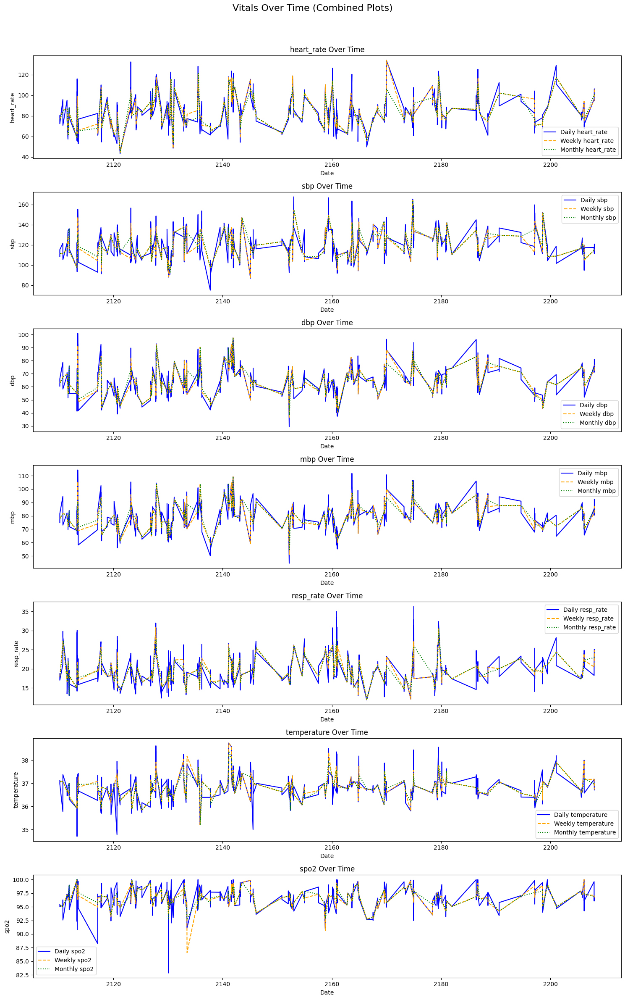

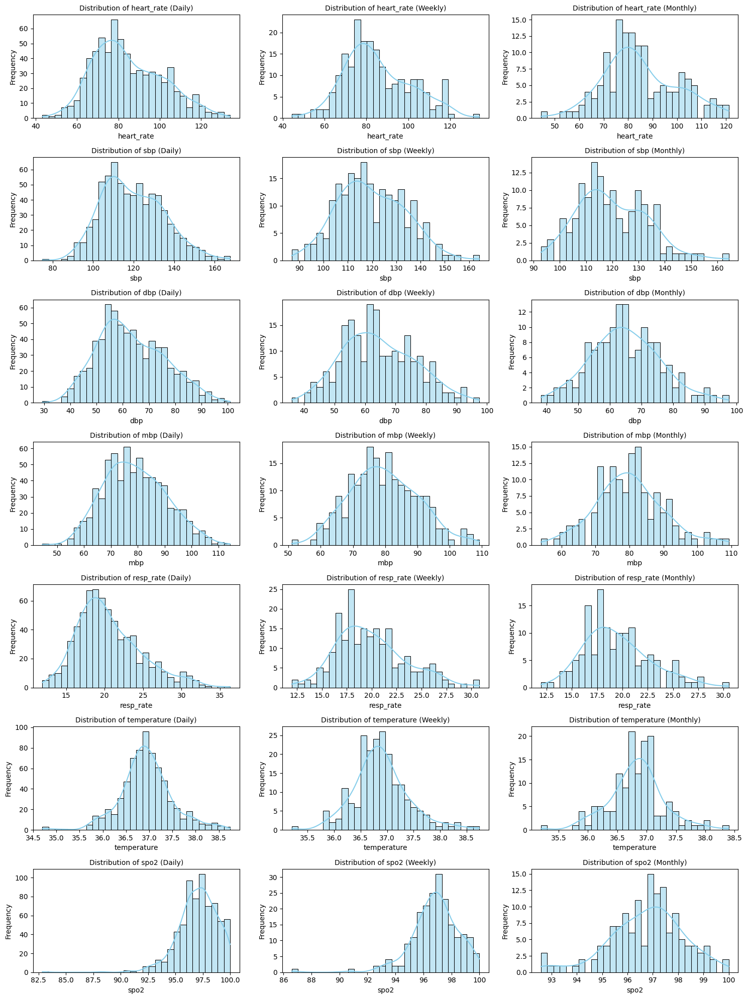

In [8]:
# Visualize resampled dataframes; plot values over time, value distribution
plot_vital_trends(daily_vitals, weekly_vitals, monthly_vitals, VITAL_COLS)
plot_vital_distributions(daily_vitals, weekly_vitals, monthly_vitals, VITAL_COLS)

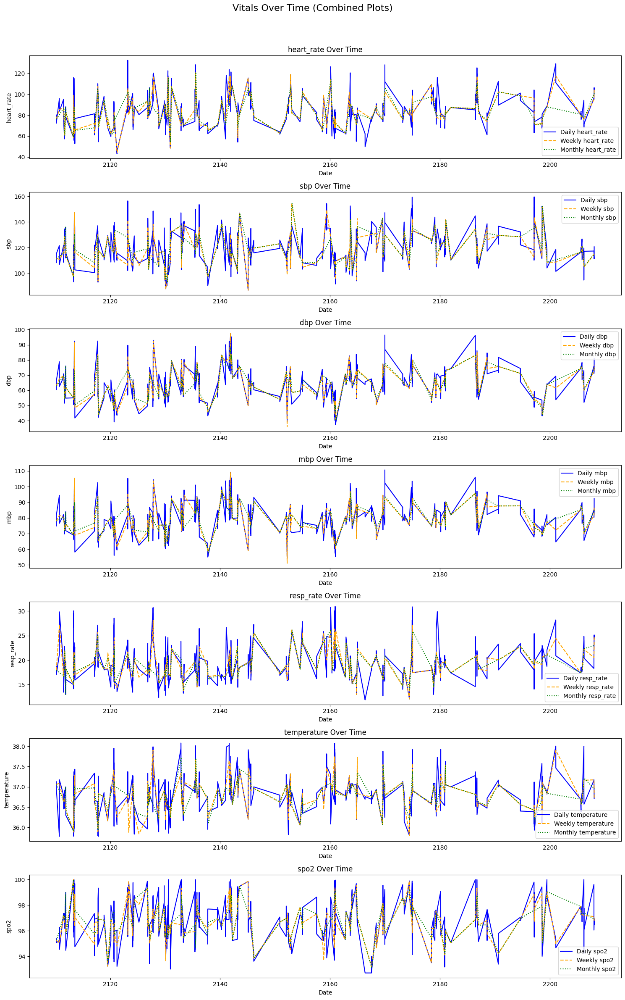

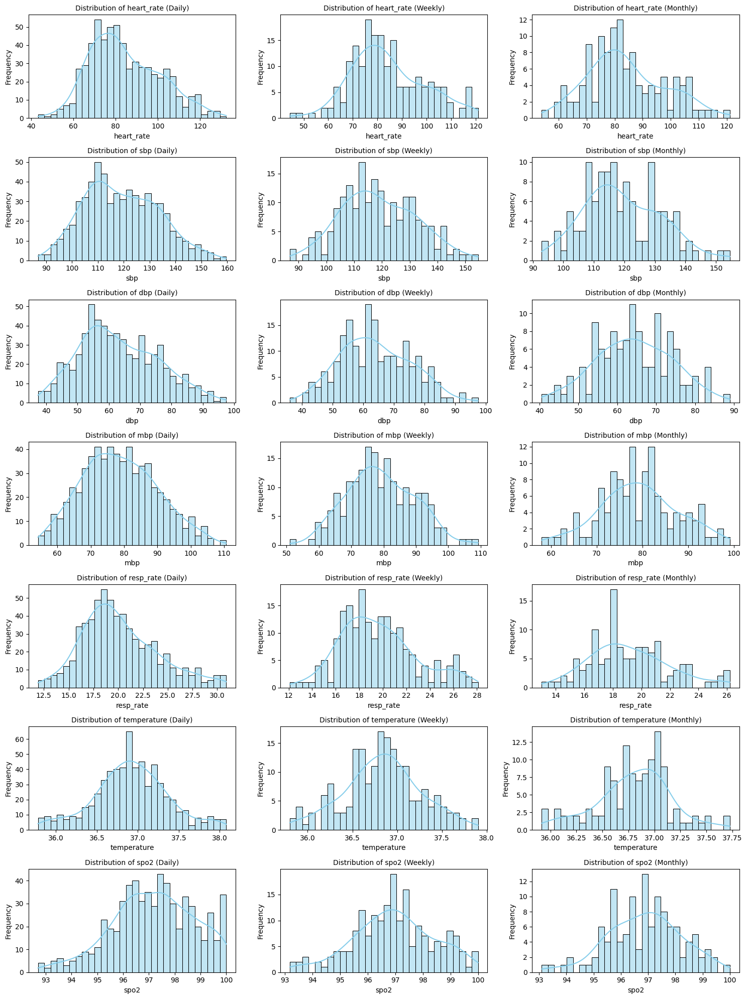

In [9]:
# Visualize cleaned dataframes; plot values over time, value distribution
plot_vital_trends(daily_vitals_cleaned, weekly_vitals_cleaned, monthly_vitals_cleaned, VITAL_COLS)
plot_vital_distributions(daily_vitals_cleaned, weekly_vitals_cleaned, monthly_vitals_cleaned, VITAL_COLS)



=== heart_rate Statistics (Daily) ===
Original Daily Mean: 84.75, Std Dev: 16.77
Cleaned Daily Mean: 84.44, Std Dev: 16.54
Reduction in Rows for heart_rate: 65

=== sbp Statistics (Daily) ===
Original Daily Mean: 119.60, Std Dev: 15.17
Cleaned Daily Mean: 119.14, Std Dev: 14.25
Reduction in Rows for sbp: 65

=== dbp Statistics (Daily) ===
Original Daily Mean: 63.27, Std Dev: 12.68
Cleaned Daily Mean: 63.15, Std Dev: 12.50
Reduction in Rows for dbp: 65

=== mbp Statistics (Daily) ===
Original Daily Mean: 78.97, Std Dev: 11.52
Cleaned Daily Mean: 78.75, Std Dev: 11.16
Reduction in Rows for mbp: 65

=== resp_rate Statistics (Daily) ===
Original Daily Mean: 20.58, Std Dev: 4.17
Cleaned Daily Mean: 20.19, Std Dev: 3.82
Reduction in Rows for resp_rate: 65

=== temperature Statistics (Daily) ===
Original Daily Mean: 36.94, Std Dev: 0.56
Cleaned Daily Mean: 36.92, Std Dev: 0.46
Reduction in Rows for temperature: 65

=== spo2 Statistics (Daily) ===
Original Daily Mean: 97.06, Std Dev: 1.81
Cle

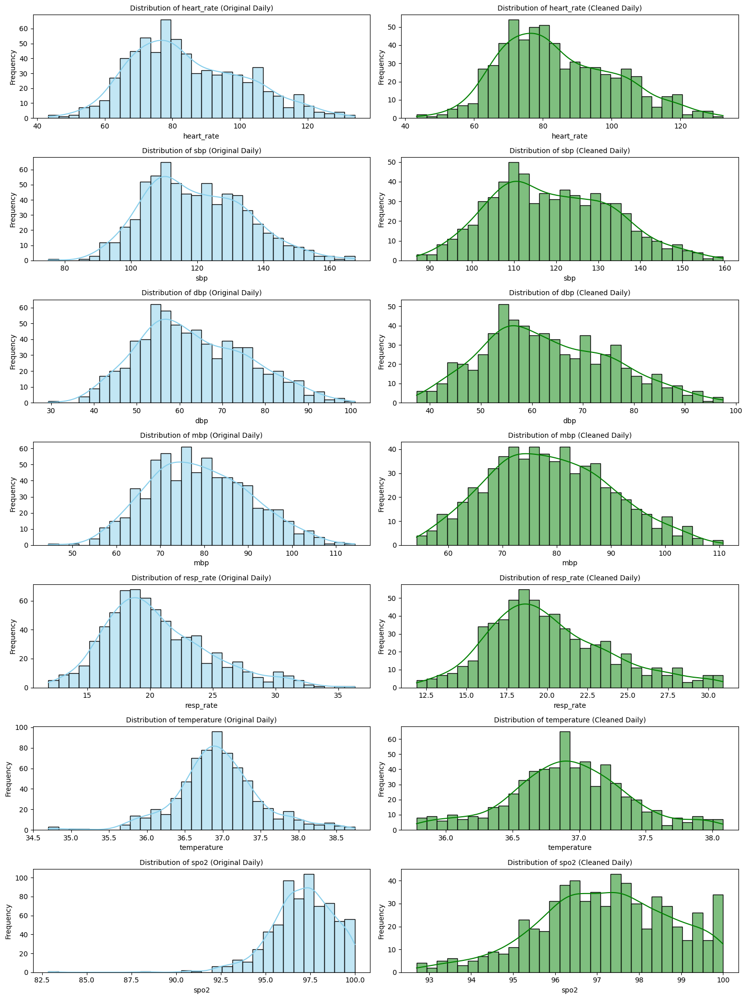

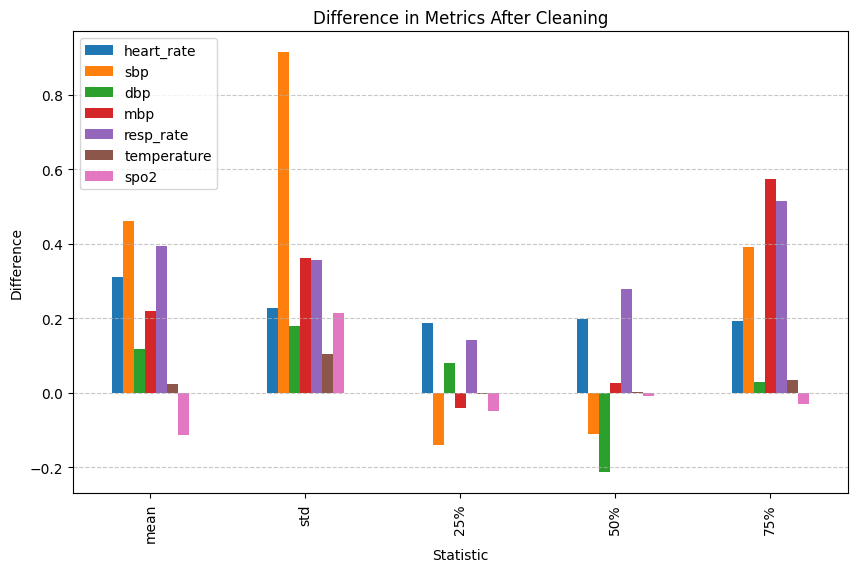

In [16]:
# Visualize impact of IQR, compare distributions between resampled and IQR dataframes

plot_distribution_comparison(daily_vitals, daily_vitals_cleaned, VITAL_COLS, title_prefix="Daily")
# plot_distribution_comparison(weekly_vitals, weekly_vitals_cleaned, VITAL_COLS, title_prefix="Weekly")
# plot_distribution_comparison(monthly_vitals, monthly_vitals_cleaned, VITAL_COLS, title_prefix="Monthly")

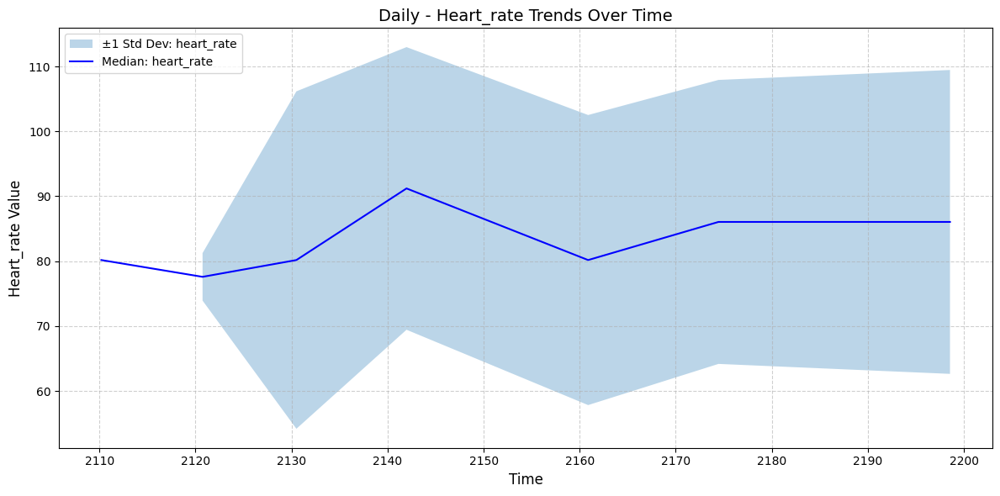

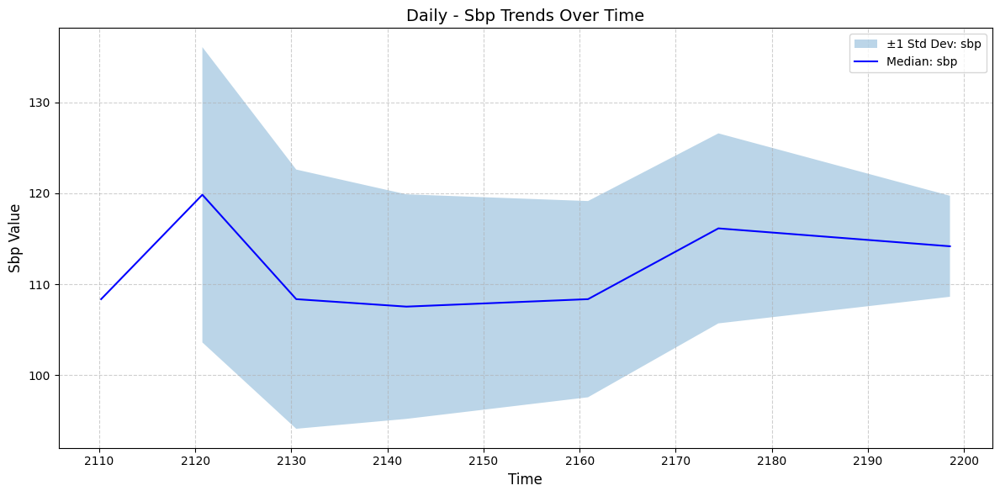

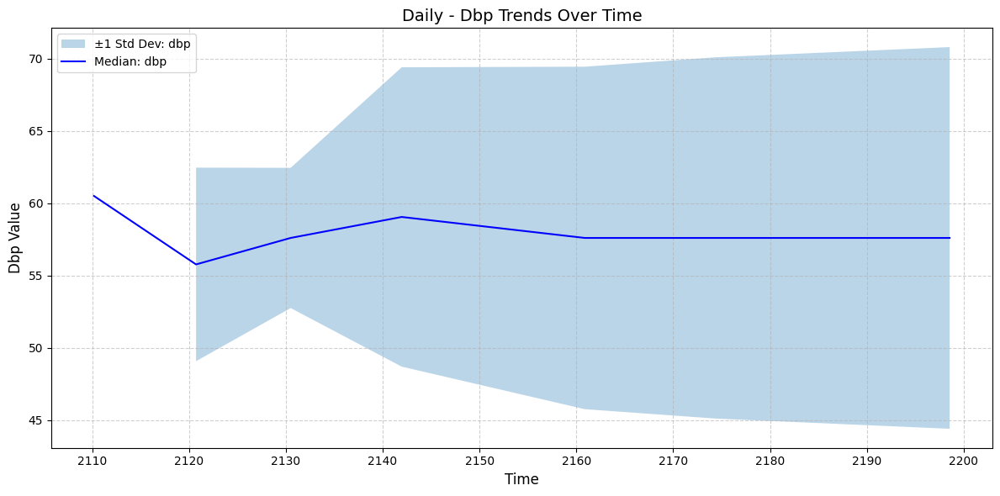

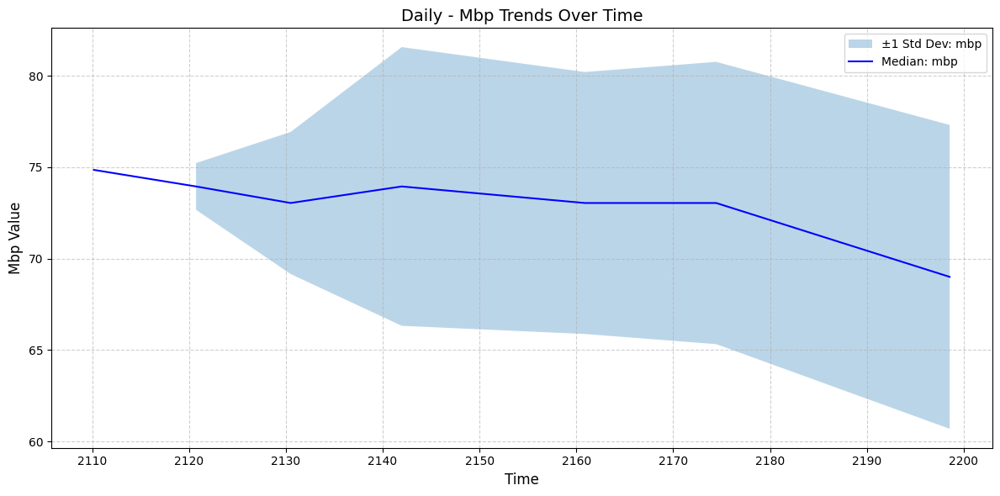

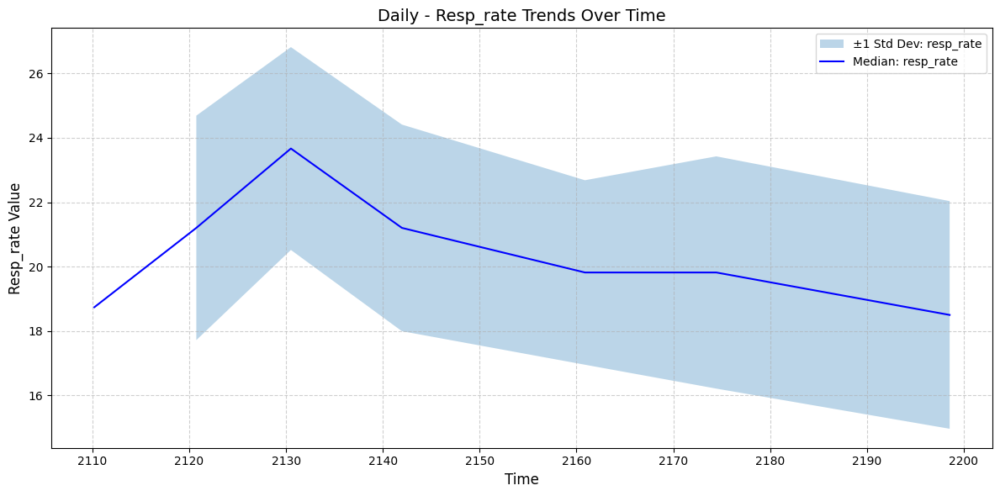

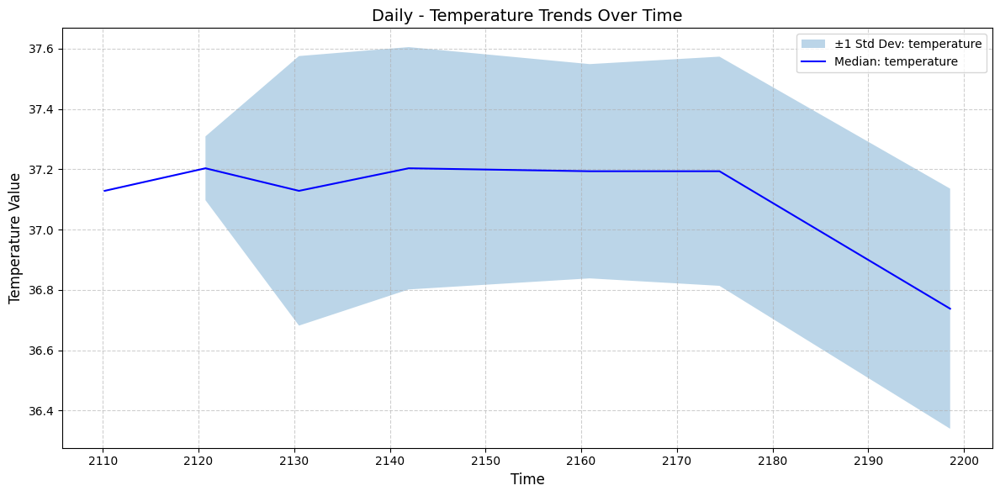

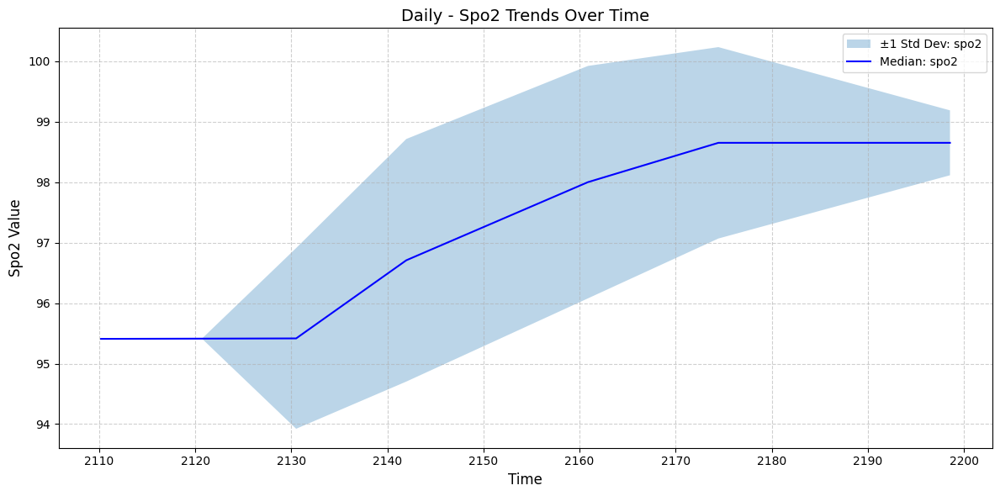

In [14]:
# Visualize each vital sign with standard deviation for context
plot_trend_with_deviation(daily_vitals_cleaned, VITAL_COLS, 'Daily', 100)
# plot_trend_with_deviation(weekly_vitals_cleaned, VITAL_COLS, 'Weekly', 25)
# plot_trend_with_deviation(monthly_vitals_cleaned, VITAL_COLS, 'Monthly', 15)


In [21]:
### optional, means to save dataframes
# from file_utils import save_dataframes

# save_dataframes({
#     "daily_vitals": daily_vitals,
#     "daily_vitals_cleaned": daily_vitals_cleaned,
#     "weekly_vitals": weekly_vitals,
#     "weekly_vitals_cleaned": weekly_vitals_cleaned,
#     "monthly_vitals": monthly_vitals,
#     "monthly_vitals_cleaned": monthly_vitals_cleaned
# })

In [16]:
# Inspect vitals_df, just check for data quality
inspect_dataframe(vitals_df, VITAL_COLS)



=== ===
Shape: (23015, 14)

Columns: ['subject_id', 'stay_id', 'heart_rate', 'sbp', 'dbp', 'mbp', 'sbp_ni', 'dbp_ni', 'mbp_ni', 'resp_rate', 'temperature', 'temperature_site', 'spo2', 'glucose']

Sample of first few rows:
                     subject_id   stay_id  heart_rate    sbp   dbp   mbp  \
charttime                                                                  
2173-03-20 20:00:00    10004113  39774222        91.0  124.0  76.0  93.0   
2173-03-20 20:20:00    10004113  39774222        86.0    NaN   NaN   NaN   

                     sbp_ni  dbp_ni  mbp_ni  resp_rate  temperature  \
charttime                                                             
2173-03-20 20:00:00     NaN     NaN     NaN       15.0        37.06   
2173-03-20 20:20:00     NaN     NaN     NaN       19.0          NaN   

                    temperature_site  spo2  glucose  
charttime                                            
2173-03-20 20:00:00             Oral  99.0      NaN  
2173-03-20 20:20:00      

In [48]:
# Create feature_df, copy of vitals_df, for use in feature engineering
if vitals_df is None or vitals_df.empty:
    print("Warning: vitals_df is empty or None")
else:
    feature_df = vitals_df.copy()
inspect_dataframe(feature_df, VITAL_COLS)



=== ===
Shape: (23015, 14)

Columns: ['subject_id', 'stay_id', 'heart_rate', 'sbp', 'dbp', 'mbp', 'sbp_ni', 'dbp_ni', 'mbp_ni', 'resp_rate', 'temperature', 'temperature_site', 'spo2', 'glucose']

Sample of first few rows:
                     subject_id   stay_id  heart_rate    sbp   dbp   mbp  \
charttime                                                                  
2173-03-20 20:00:00    10004113  39774222        91.0  124.0  76.0  93.0   
2173-03-20 20:20:00    10004113  39774222        86.0    NaN   NaN   NaN   

                     sbp_ni  dbp_ni  mbp_ni  resp_rate  temperature  \
charttime                                                             
2173-03-20 20:00:00     NaN     NaN     NaN       15.0        37.06   
2173-03-20 20:20:00     NaN     NaN     NaN       19.0          NaN   

                    temperature_site  spo2  glucose  
charttime                                            
2173-03-20 20:00:00             Oral  99.0      NaN  
2173-03-20 20:20:00      

In [49]:
# Add basic temporal features, based on charttime
feature_df, temporal_features = add_temporal_features(feature_df, 'charttime')

# Add computed ratios and interaction metrics
feature_df, vital_ratio_features = add_vital_ratio_and_interaction_features(feature_df)

# Add statistical features, per vital sign
feature_df, statistical_features = add_statistical_features(feature_df, VITAL_COLS)

# Add variability metrics, per vital sign
feature_df, variability_features = add_variability_features(feature_df, VITAL_COLS)

# Compare number of columns before and after feature engineering
print("\nFeature engineering summary:")
print(f"Original vitals_df columns: {len(vitals_df.columns)}")
print(f"Engineered feature_df columns: {len(feature_df.columns)}")
print(f"New features added: {len(feature_df.columns) - len(vitals_df.columns)}")

# create feature_types dict, to organize recently added features
feature_types = {
    'Temporal': temporal_features,
    'Ratio': vital_ratio_features,
    'Statistical': statistical_features,
    'Variability': variability_features
}



Using specified index 'charttime' as timestamp source

New temporal features added: ['hour', 'day_of_week', 'is_night', 'hours_since_first']

New columns added: ['shock_index', 'map_calculated', 'rox_index', 'pressure_rate_product', 'temp_hr_ratio', 'o2_efficiency']

New statistical columns added: ['heart_rate_mean', 'heart_rate_std', 'heart_rate_min', 'heart_rate_max', 'sbp_mean', 'sbp_std', 'sbp_min', 'sbp_max', 'dbp_mean', 'dbp_std', 'dbp_min', 'dbp_max', 'mbp_mean', 'mbp_std', 'mbp_min', 'mbp_max', 'resp_rate_mean', 'resp_rate_std', 'resp_rate_min', 'resp_rate_max', 'temperature_mean', 'temperature_std', 'temperature_min', 'temperature_max', 'spo2_mean', 'spo2_std', 'spo2_min', 'spo2_max']

New variability features added: ['heart_rate_diff', 'heart_rate_abs_diff', 'heart_rate_pct_change', 'sbp_diff', 'sbp_abs_diff', 'sbp_pct_change', 'dbp_diff', 'dbp_abs_diff', 'dbp_pct_change', 'mbp_diff', 'mbp_abs_diff', 'mbp_pct_change', 'resp_rate_diff', 'resp_rate_abs_diff', 'resp_rate_pct_ch

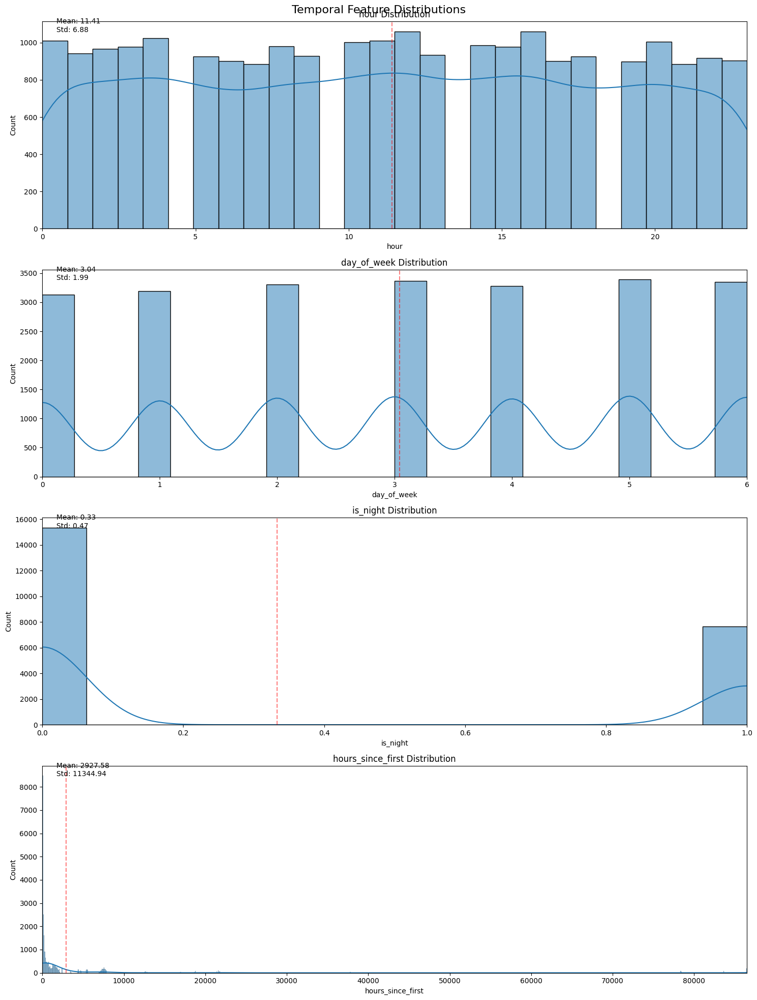

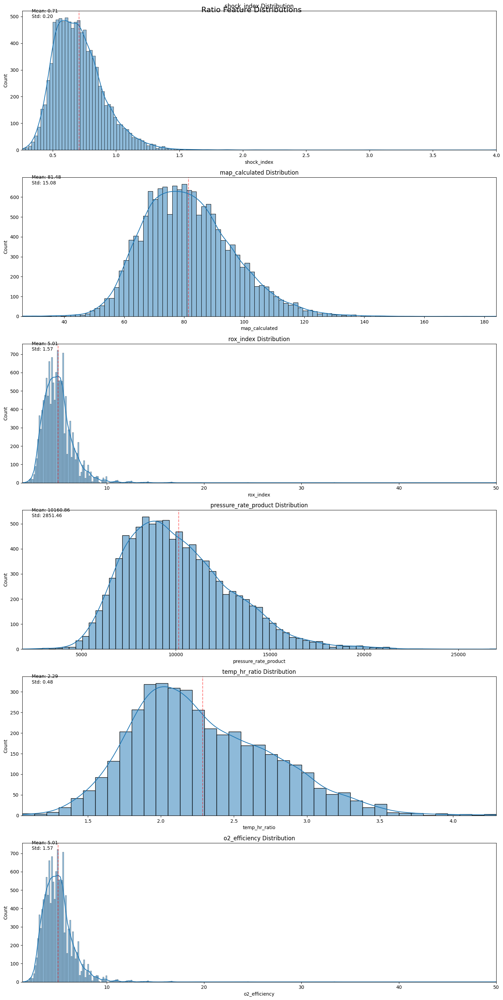

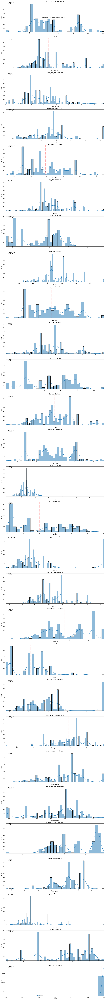

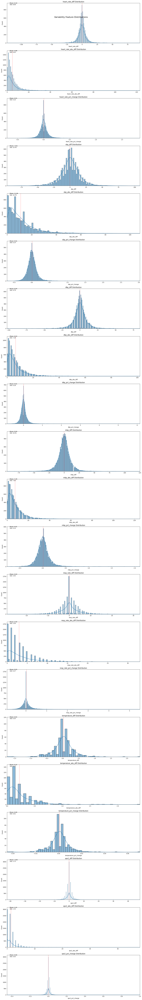

In [63]:
# Visualize distributions for the newly-created features
plot_feature_distributions(feature_df, feature_types)

C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels

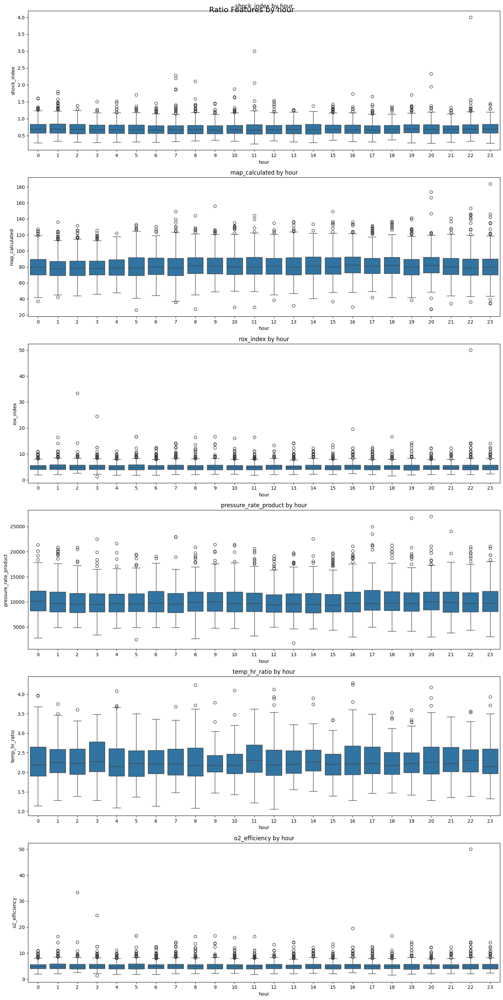

C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels

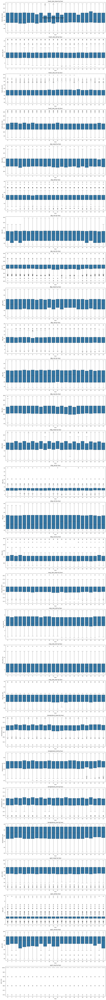

C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45 if len(str(plot_df[time_unit].iloc[0])) > 3 else 0)
C:\Users\steve\AppData\Local\Temp\ipykernel_9016\831342491.py:248: UserWarning: set_ticklabels

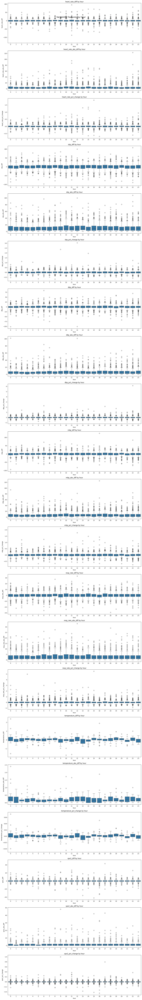

In [65]:
# Visualize temporal patterns for the newly-created features, with box and whisker plots
# plot_temporal_patterns(feature_df, feature_types, time_unit='hour')
plot_temporal_patterns(feature_df, feature_types, time_unit='day_of_week')


Strongest Feature Correlations (|correlation| >= 0.7):
o2_efficiency ~ rox_index: 1.000
temperature_pct_chg ~ temperature_diff: 0.999
spo2_pct_chg ~ spo2_diff: 0.977
mbp_pct_chg ~ mbp_diff: 0.958
heart_pct_chg ~ heart_diff: 0.952
sbp_pct_chg ~ sbp_diff: 0.948
mbp_mean ~ dbp_mean: 0.947
resp_max ~ mbp_max: 0.905
mbp_diff ~ dbp_diff: 0.903
dbp_pct_chg ~ dbp_diff: 0.889


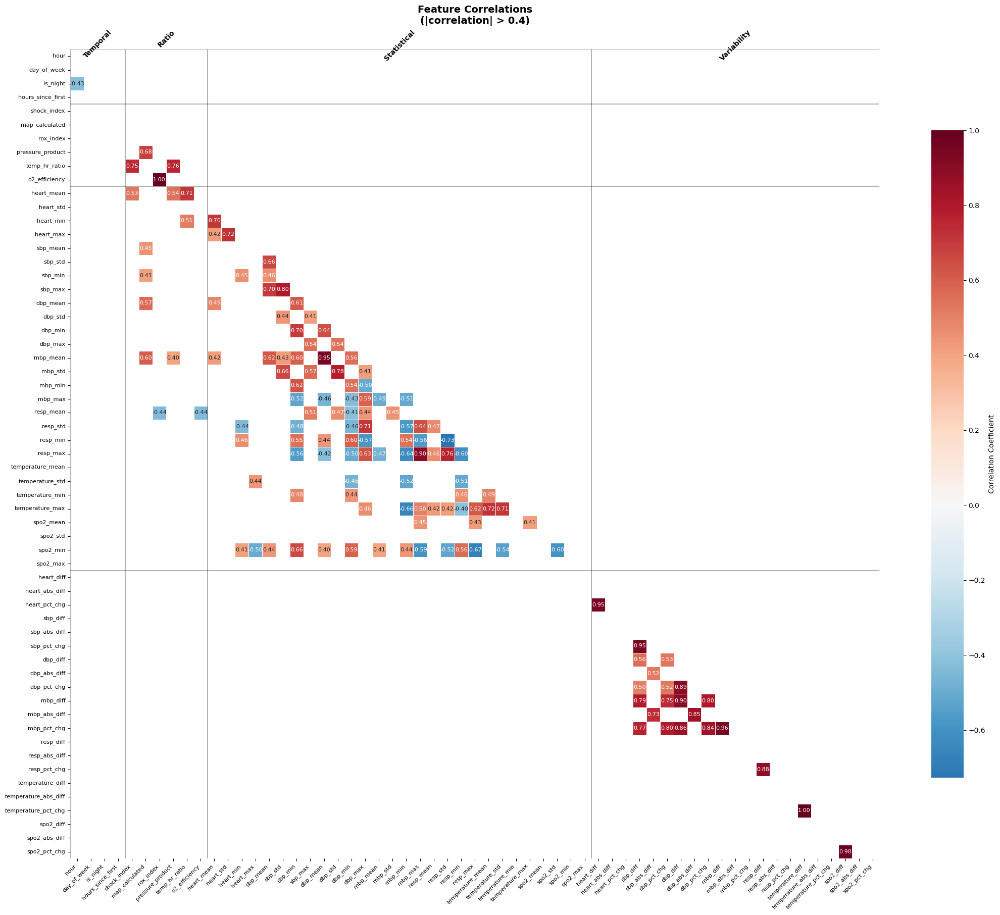

In [72]:
# Visualize feature correlations across all features, with additional context
plot_feature_correlations_r2(feature_df, feature_types, threshold=0.4)

In [ ]:
# Clustering pipeline; applying PCA, UMAP, KMeans, RandomForest

X_transformed, transformers = prepare_features(feature_df, feature_types)

optimized_umap_context = optimize_umap(X_transformed, n_trials=20)

# todo reducer fn and/or conditional
reducer = umap.UMAP(**optimized_umap_context['best_params'], random_state=42)
X_reduced = reducer.fit_transform(X_transformed)

optimized_clusters_pca = optimize_clusters(X_transformed, max_k=15) # not reduced
optimized_clusters_reduced = optimize_clusters(X_reduced, max_k=15) # reduced

kmeans_pca = perform_clustering(X_transformed, optimized_clusters_pca['optimal_k']) # not reduced
kmeans_reduced = perform_clustering(X_reduced, optimized_clusters_reduced['optimal_k']) # reduced

feature_importance_pca = compute_feature_importance(X_transformed, kmeans_pca) # not reduced
feature_importance_reduced = compute_feature_importance(X_reduced, kmeans_reduced) # reduced


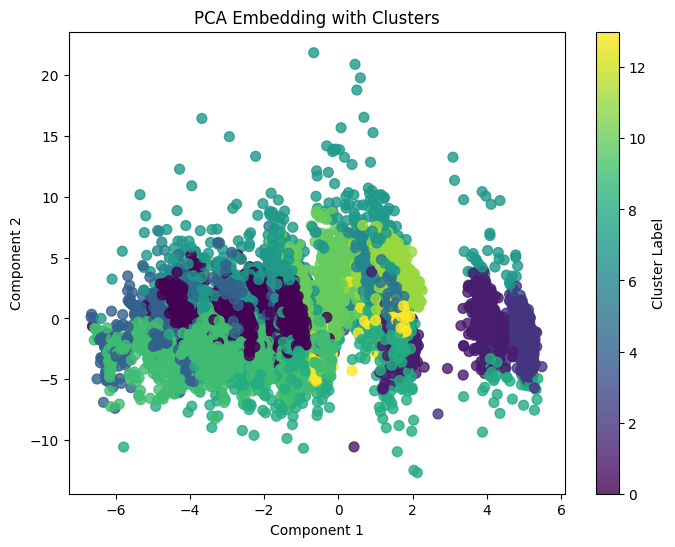

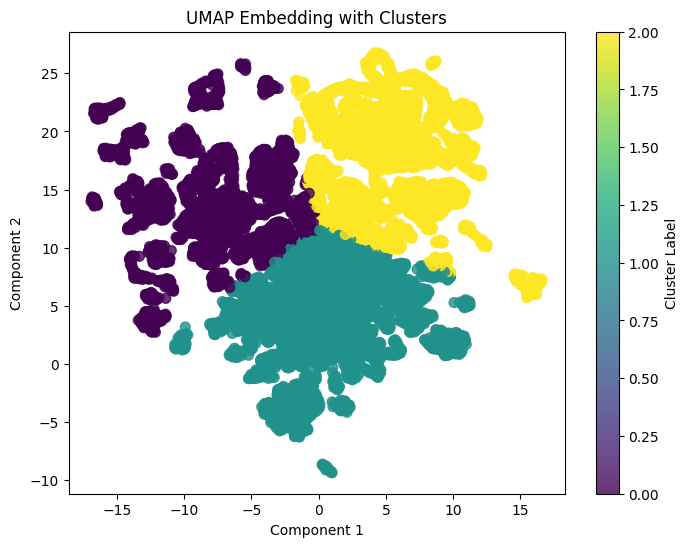

In [79]:
# Visualize clustering outcomes for PCA and UMAP

plot_data = {
    "PCA": PlotData(method="PCA", embedding=X_transformed, clusters=kmeans_pca),
    "UMAP": PlotData(method="UMAP", embedding=X_reduced, clusters=kmeans_reduced)
}


# Plot PCA embedding
ax1 = plot_embedding(plot_data["PCA"], title="PCA Embedding with Clusters")
plt.show()


# Plot UMAP embedding
ax2 = plot_embedding(plot_data["UMAP"], title="UMAP Embedding with Clusters")
plt.show()


In [85]:
optimized_umap_context['best_params']


{'n_neighbors': 43,
 'min_dist': 0.7716878746865379,
 'n_components': 2,
 'metric': 'manhattan'}

In [93]:
def generate_summary(
    transformers,
    optimized_umap_context,
    optimized_clusters_pca,
    optimized_clusters_reduced,
    feature_importance_pca,
    feature_importance_reduced,
    X_transformed,
    X_reduced
):
    """
    Aggregate key outputs from data preparation, UMAP optimization, clustering,
    and feature importance into a summarized output.
    """
    summary = {}

    # --- Feature Preparation Summary ---
    pca_obj = transformers.get('pca')
    summary['feature_preparation'] = {
        "num_features": int(X_transformed.shape[1]),
        "pca_components": int(X_transformed.shape[1]),
        # "explained_variance_ratio": pca_obj.explained_variance_ratio_.tolist() if pca_obj is not None else None,
        # "cumulative_explained_variance": pca_obj.explained_variance_ratio_.cumsum().tolist() if pca_obj is not None else None
    }

    # --- UMAP Optimization Summary ---
    # Convert any NumPy scalars to Python types
    best_params = optimized_umap_context['best_params']
    best_score = optimized_umap_context['best_score']
    if isinstance(best_score, (np.floating, np.integer)):
        best_score = float(best_score)

    summary['umap_optimization'] = {
        "best_params": best_params,
        "best_score": best_score
    }
    

    # # --- Clustering Summary ---
    # summary['clustering'] = {
    #     "pca": {
    #         "optimal_k": int(optimized_clusters_pca['optimal_k']),
    #         "scores": optimized_clusters_pca['scores'],
    #         "feature_importance": feature_importance_pca.to_dict(orient='records')
    #     },
    #     "umap": {
    #         "optimal_k": int(optimized_clusters_reduced['optimal_k']),
    #         "scores": optimized_clusters_reduced['scores'],
    #         "feature_importance": feature_importance_reduced.to_dict(orient='records')
    #     }
    # }

    # # --- Modeling Shapes / Outputs ---
    summary['modeling'] = {
        "pca_transformed_shape": list(X_transformed.shape),
        "umap_reduced_shape": list(X_reduced.shape)
    }

    # # --- Optional: Additional Highlights ---
    # summary['highlights'] = {
    #     "note": "This summary is extendable with additional metrics, comments, or insights."
    # }

    return summary

# Generate the summary and dump to JSON:
summary_output = generate_summary(
    transformers=transformers,
    optimized_umap_context=optimized_umap_context,
    optimized_clusters_pca=optimized_clusters_pca,
    optimized_clusters_reduced=optimized_clusters_reduced,
    feature_importance_pca=feature_importance_pca,
    feature_importance_reduced=feature_importance_reduced,
    X_transformed=X_transformed,
    X_reduced=X_reduced
)

import json
print(json.dumps(summary_output, indent=4))


{
    "feature_preparation": {
        "num_features": 30,
        "pca_components": 30
    },
    "umap_optimization": {
        "best_params": {
            "n_neighbors": 43,
            "min_dist": 0.7716878746865379,
            "n_components": 2,
            "metric": "manhattan"
        },
        "best_score": -89.67391967773438
    }
}


In [38]:
def run_cluster_analysis(feature_df, feature_types, transformers=None, n_clusters_max=8):
    """
    Compute clustering analysis results
    """
    print("Starting cluster analysis...")
    
    # 1. Prepare features
    if transformers is None:
        print("Preparing new features...")
        X_transformed, transformers = prepare_features(feature_df, feature_types)
    else:
        print("Using existing transformers...")
        numeric_features = [col for ftype in feature_types.values() 
                          for col in ftype if col in feature_df.columns 
                          and feature_df[col].dtype in ['float64', 'int64']]
        X_scaled = transformers['scaler'].transform(feature_df[numeric_features])
        X_transformed = transformers['pca'].transform(X_scaled)
    
    print(f"Working with {X_transformed.shape[1]} principal components")
    
    # 2. UMAP transformation for visualization
    print("\nOptimizing UMAP parameters...")
    best_params, best_score = optimize_umap_params(X_transformed, n_trials=20)
    print(f"Best UMAP parameters found: {best_params}")
    
    reducer = umap.UMAP(**best_params, random_state=42)
    X_umap = reducer.fit_transform(X_transformed)
    
    # 3. Find optimal number of clusters
    print("\nFinding optimal number of clusters...")
    optimal_k, metrics = optimize_clustering_params(X_umap, max_clusters=n_clusters_max)
    print(f"Optimal number of clusters: {optimal_k}")
    
    # 4. Perform clustering on original PCA space
    print("\nPerforming clustering in PCA space...")
    kmeans_pca = KMeans(n_clusters=optimal_k, random_state=42)
    clusters = kmeans_pca.fit_predict(X_transformed)
    
    # 5. Compute feature importance
    print("\nComputing feature importance...")
    numeric_features = [col for ftype in feature_types.values() 
                       for col in ftype if col in feature_df.columns 
                       and feature_df[col].dtype in ['float64', 'int64']]
    
    feature_importance = pd.DataFrame(
        transformers['pca'].components_,
        columns=numeric_features
    ).abs().sum()
    
    # 6. Generate cluster profiles using PCA space centers
    print("\nGenerating cluster profiles...")
    cluster_centers_pca = kmeans_pca.cluster_centers_  # Using PCA space centers
    cluster_centers_scaled = transformers['pca'].inverse_transform(cluster_centers_pca)
    cluster_centers_original = transformers['scaler'].inverse_transform(cluster_centers_scaled)
    
    cluster_profiles = pd.DataFrame(
        cluster_centers_original,
        columns=numeric_features
    )
    
    print("\nAnalysis complete!")
    
    return {
        'clusters': clusters,
        'umap_coords': X_umap,
        'cluster_profiles': cluster_profiles,
        'metrics': metrics,
        'optimal_k': optimal_k,
        'feature_importance': feature_importance,
        'best_umap_params': best_params,
        'best_umap_score': best_score,
        'transformers': transformers,
        'numeric_features': numeric_features
    }


d:\Projects\3m-pipeline\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Computing cluster analysis...
Starting cluster analysis...
Preparing new features...
Working with 35 principal components

Optimizing UMAP parameters...


d:\Projects\3m-pipeline\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Projects\3m-pipeline\venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Projects\3m-pipeline\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Projects\3m-pipeline\venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Projects\3m-pipeline\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Projects\3m-pipeline\venv\Lib\site-packages\u

Best UMAP parameters found: {'n_neighbors': np.int64(20), 'min_dist': np.float64(0.1), 'metric': np.str_('cosine')}


d:\Projects\3m-pipeline\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Projects\3m-pipeline\venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(



Finding optimal number of clusters...
Optimal number of clusters: 3

Performing clustering in PCA space...

Computing feature importance...

Generating cluster profiles...

Analysis complete!


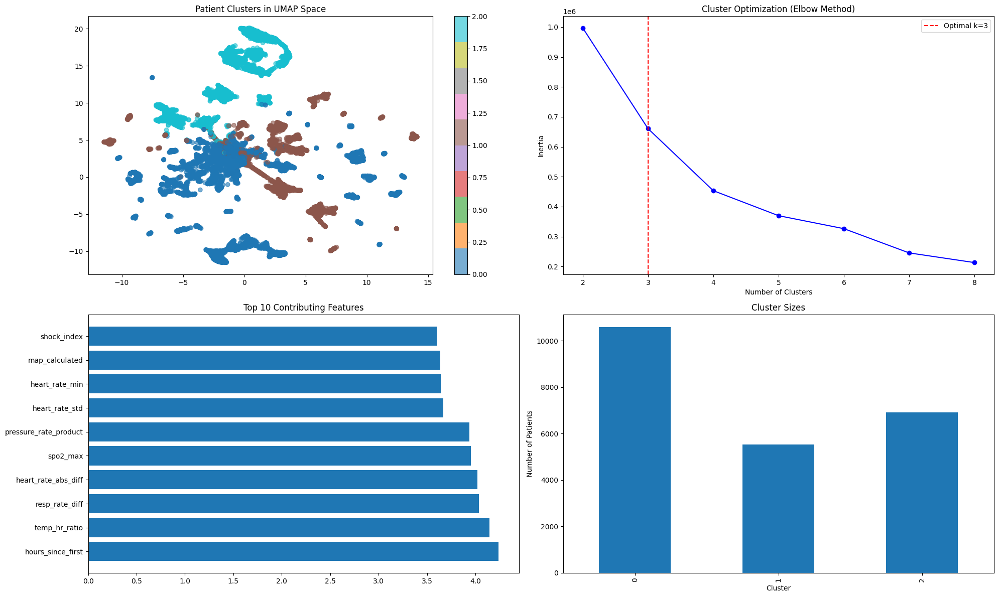


Cluster Clinical Characteristics:

Cluster 0 (n=10588):
Key Vitals (mean values):

Cluster 1 (n=5524):
Key Vitals (mean values):

Cluster 2 (n=6903):
Key Vitals (mean values):


In [52]:
print("Computing cluster analysis...")
cluster_results = run_cluster_analysis(
    feature_df, 
    feature_types,
    transformers=None
)


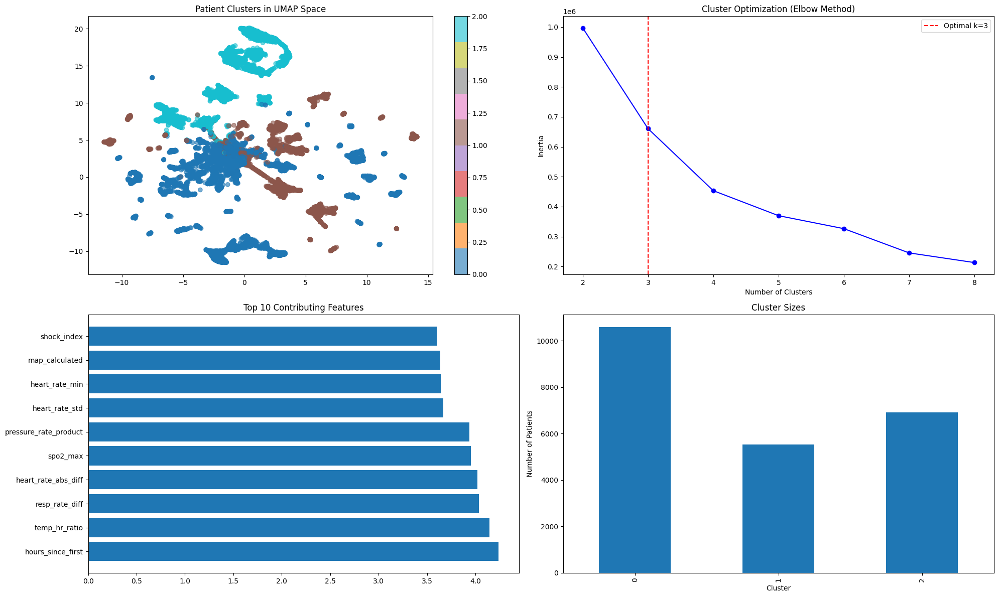


Cluster Clinical Characteristics:

Cluster 0 (n=10588):

Vital Signs (mean ± std):
- Heart Rate (bpm): 86.0 ± 11.1
- Systolic BP (mmHg): 118.6 ± 14.3
- Respiratory Rate (bpm): 18.7 ± 3.9
- Temperature (°C): 37.0 ± 0.5
- SpO2 (%): 97.0 ± 2.2

Derived Metrics:
- Shock Index: 0.71
- Mean Arterial Pressure (mmHg): 82.38
- ROX Index: 5.25
- Pressure-Rate Product: 10040.42
- O2 Efficiency: 5.25

Variability Metrics:
- Heart Rate % Change: 0.0%
- Sbp % Change: 0.0%
- Resp Rate % Change: 0.0%
- Temperature % Change: 0.0%
- Spo2 % Change: 0.0%

Cluster 1 (n=5524):

Vital Signs (mean ± std):
- Heart Rate (bpm): 92.6 ± 14.8
- Systolic BP (mmHg): 128.9 ± 20.0
- Respiratory Rate (bpm): 23.3 ± 5.2
- Temperature (°C): 37.0 ± 0.5
- SpO2 (%): 96.9 ± 2.8

Derived Metrics:
- Shock Index: 0.73
- Mean Arterial Pressure (mmHg): 87.88
- ROX Index: 4.56
- Pressure-Rate Product: 11093.76
- O2 Efficiency: 4.56

Variability Metrics:
- Heart Rate % Change: 0.0%
- Sbp % Change: 0.0%
- Resp Rate % Change: 0.0%
- T

In [59]:
### Visualize results
plot_cluster_analysis(cluster_results)
print_cluster_summary(cluster_results)
